In [1]:
import matplotlib.pyplot as plt
import xarray as xr 
from os.path import join
from plotter import pretty_plot
import numpy as np
import itertools

In [2]:
path = '/work/mflora/ML_DATA/stratified_results'
lead_time = 'first_hour'
targets = ['tornado', 'severe_wind', 'severe_hail']
lead_times = ['first_hour', 'second_hour']

##  Initialization Time Verification 

In [ ]:
for lead_time, target in itertools.product(lead_times, targets):
    ml_ds = xr.load_dataset(join(path, f'ml_init_stratify_{lead_time}_{target}.nc'))
    new_ml_ds = xr.load_dataset(join(path, f'ml_reduced_init_stratify_{lead_time}_{target}.nc'))
    bl_ds = xr.load_dataset(join(path, f'bl_init_stratify_{lead_time}_{target}.nc'))
    
    xdata_init_times = ml_ds['xdata'].values

    f,axes=plt.subplots(ncols=2, nrows=2, dpi=300, figsize=(12,8), sharex=True)
    metrics = ['aupdc', 'auc', 'bss', 'reliability']

    for ax, metric in zip(axes.flat, metrics):
        data = {'ML' : ml_ds[metric], 'BL' : bl_ds[metric], 'ML_RED' : new_ml_ds[metric]}
    
        pretty_plot(ax, xdata_init_times, data, 
                histdata=np.mean(ml_ds['Skew'].values, axis=1)*100, 
                xlabel='Initialization Times', 
                ylabel=metric.upper(), 
                right_ylabel = 'Skew (%)',
                model_name='')
    
    plt.subplots_adjust(wspace=0.5, hspace=0.2)
    plt.suptitle(f"{target.replace('_', ' ').upper()} {lead_time.replace('_', ' ').upper()}", fontsize=15)

## Forecast Lead Time  

Combined with the second hour results. 

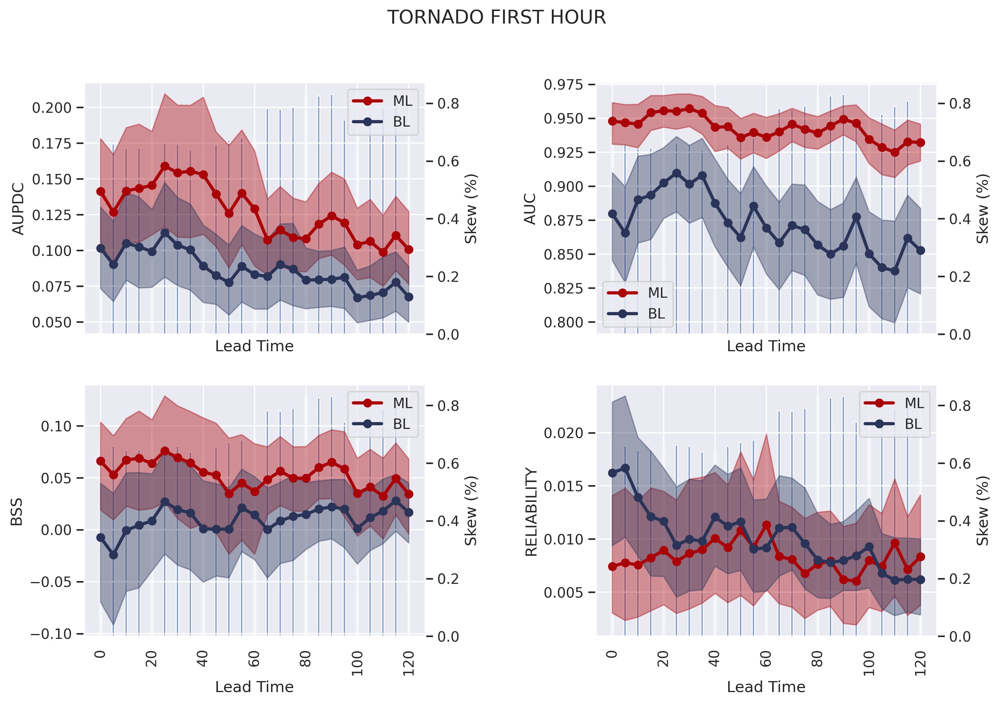

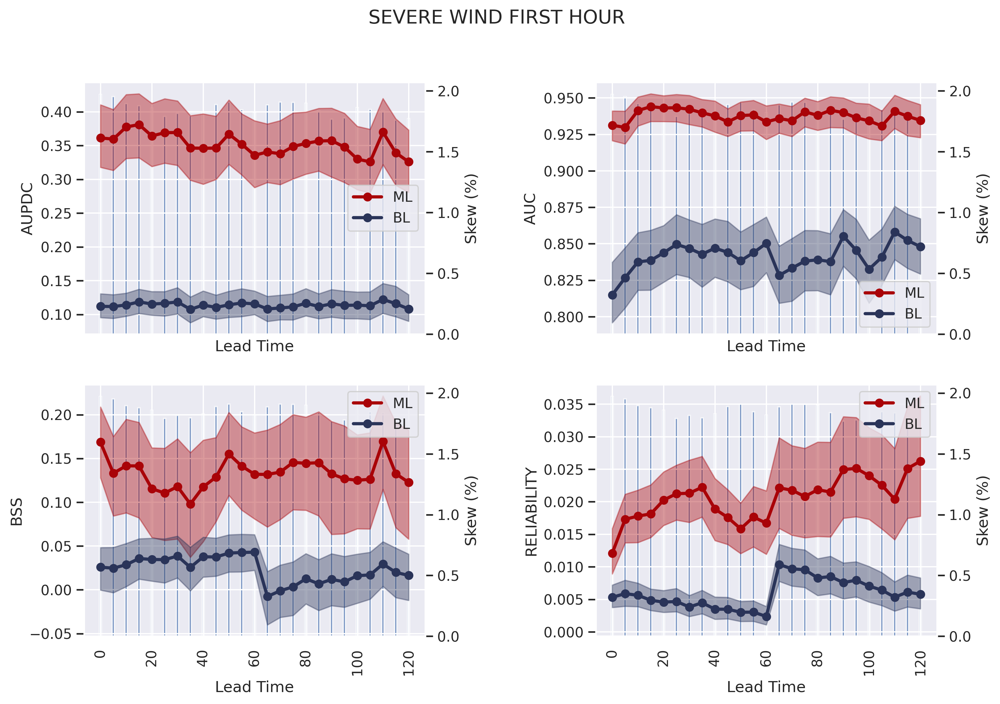

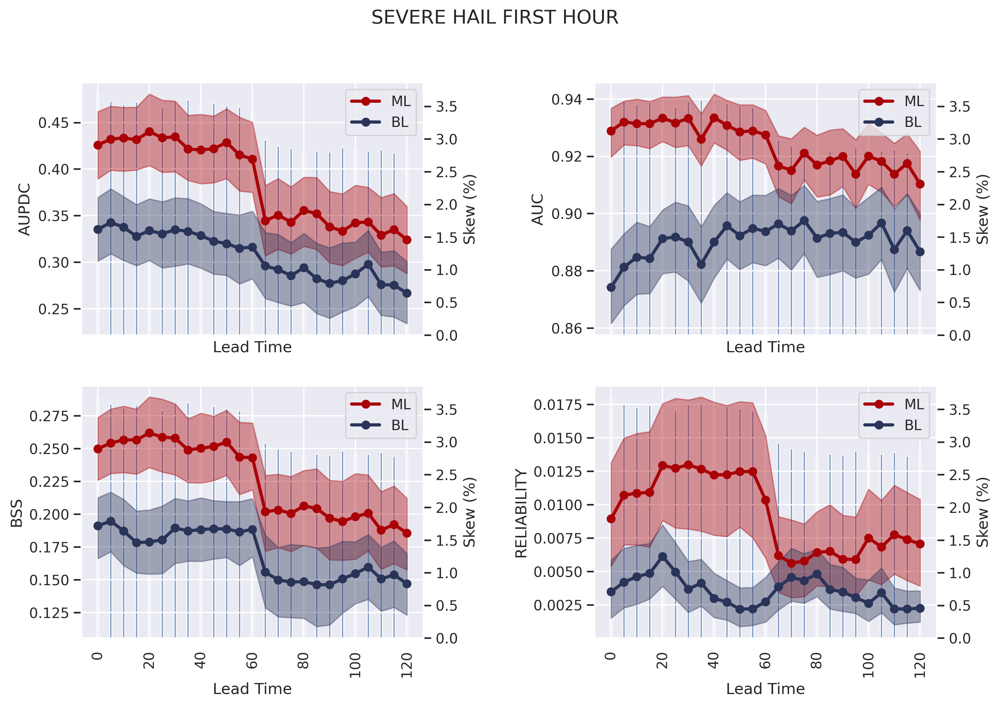

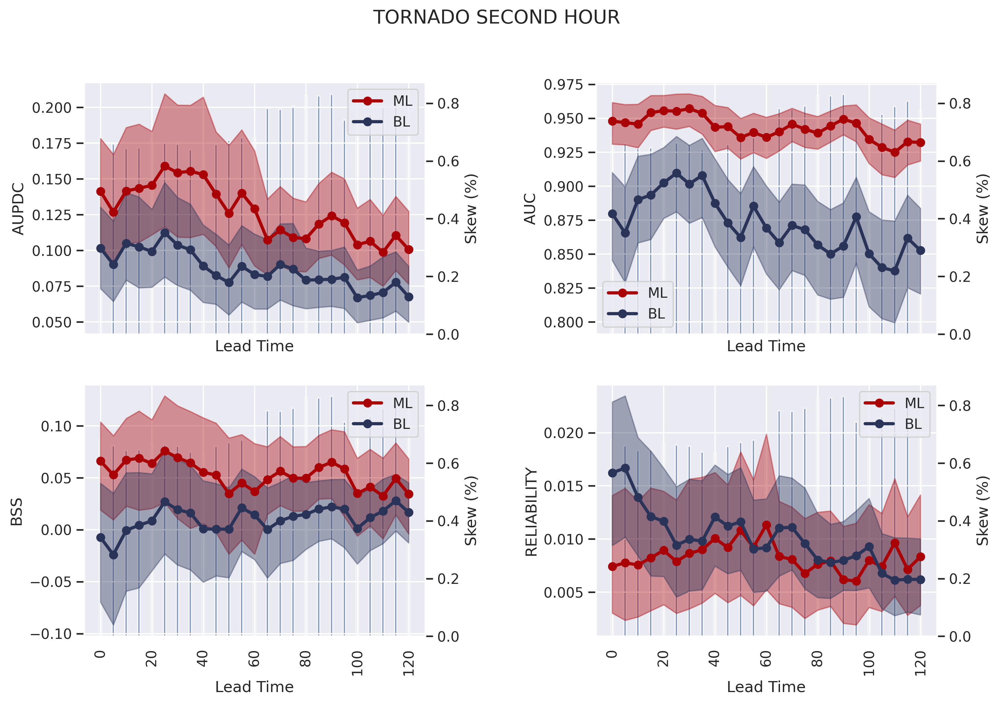

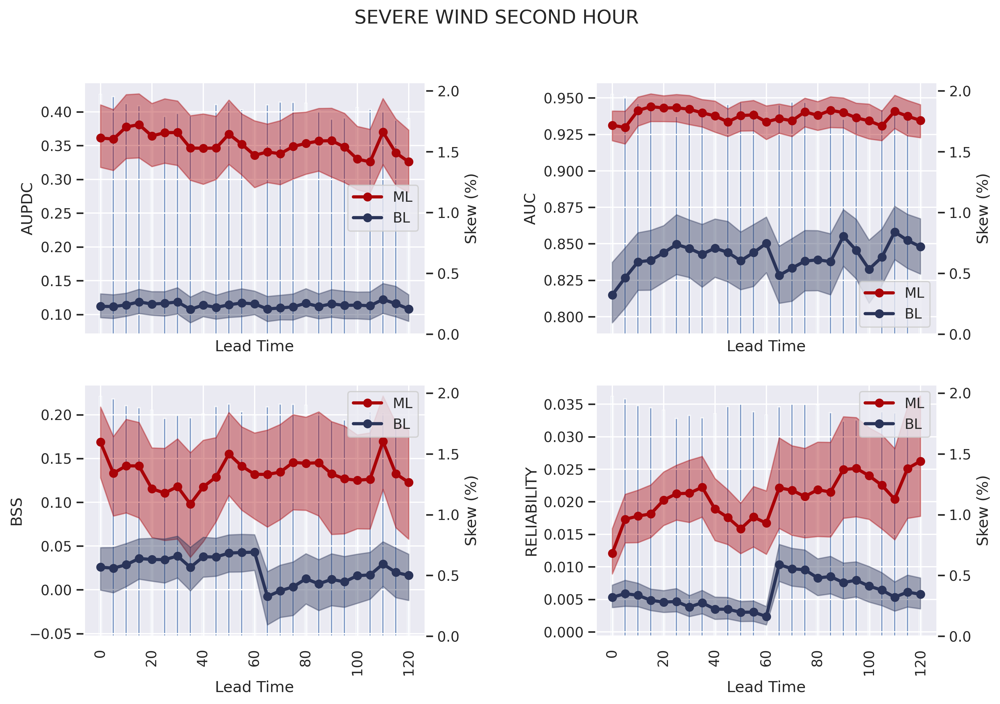

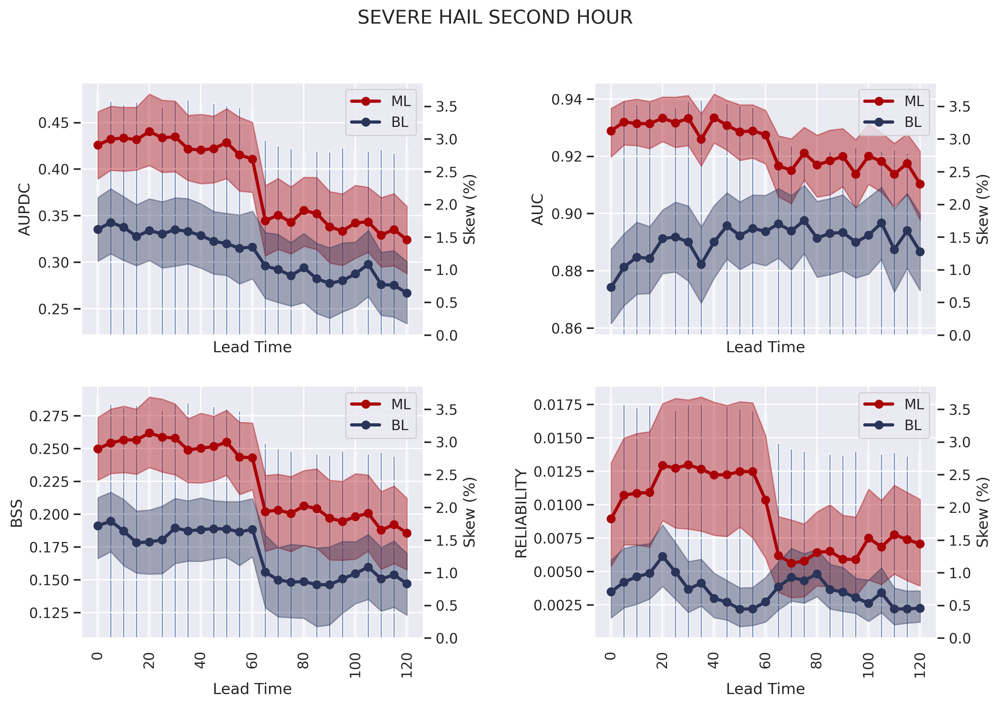

In [4]:
for target in targets:
    ml_ds1 = xr.load_dataset(join(path, f'ml_lead_time_stratify_first_hour_{target}.nc'))
    bl_ds1 = xr.load_dataset(join(path, f'bl_lead_time_stratify_first_hour_{target}.nc'))
    
    ml_ds2 = xr.load_dataset(join(path, f'ml_lead_time_stratify_second_hour_{target}.nc'))
    bl_ds2 = xr.load_dataset(join(path, f'bl_lead_time_stratify_second_hour_{target}.nc'))
    
    xdata = np.concatenate([ml_ds1['xdata'].values, ml_ds2['xdata'].values[1:]])
    
    f,axes=plt.subplots(ncols=2, nrows=2, dpi=300, figsize=(12,8), sharex=True)
    metrics = ['aupdc', 'auc', 'bss', 'reliability']

    for ax, metric in zip(axes.flat, metrics):
        ml = np.concatenate([ml_ds1[metric], ml_ds2[metric][1:]])
        bl = np.concatenate([bl_ds1[metric], bl_ds2[metric][1:]])
        counts = np.concatenate([ml_ds1['Skew'].values, ml_ds2['Skew'].values[1:]], axis=0)
        
        data = {'ML' : ml, 'BL' : bl}
    
        pretty_plot(ax, xdata, data, 
                histdata=np.mean(counts, axis=1)*100, 
                xlabel='Lead Time', 
                ylabel=metric.upper(), 
                right_ylabel = 'Skew (%)',
                model_name='')
    
    plt.subplots_adjust(wspace=0.5, hspace=0.2)
    plt.suptitle(f"{target.replace('_', ' ').upper()} {lead_time.replace('_', ' ').upper()}", fontsize=15)

## Geographic Region (with day percentage) 

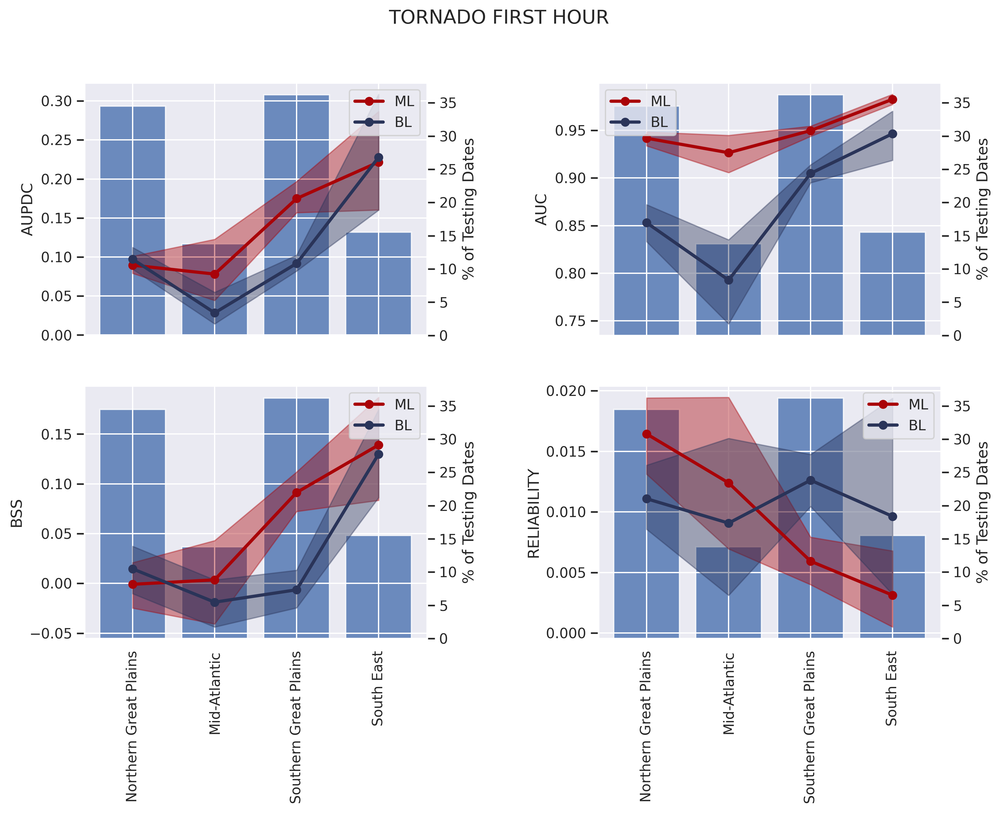

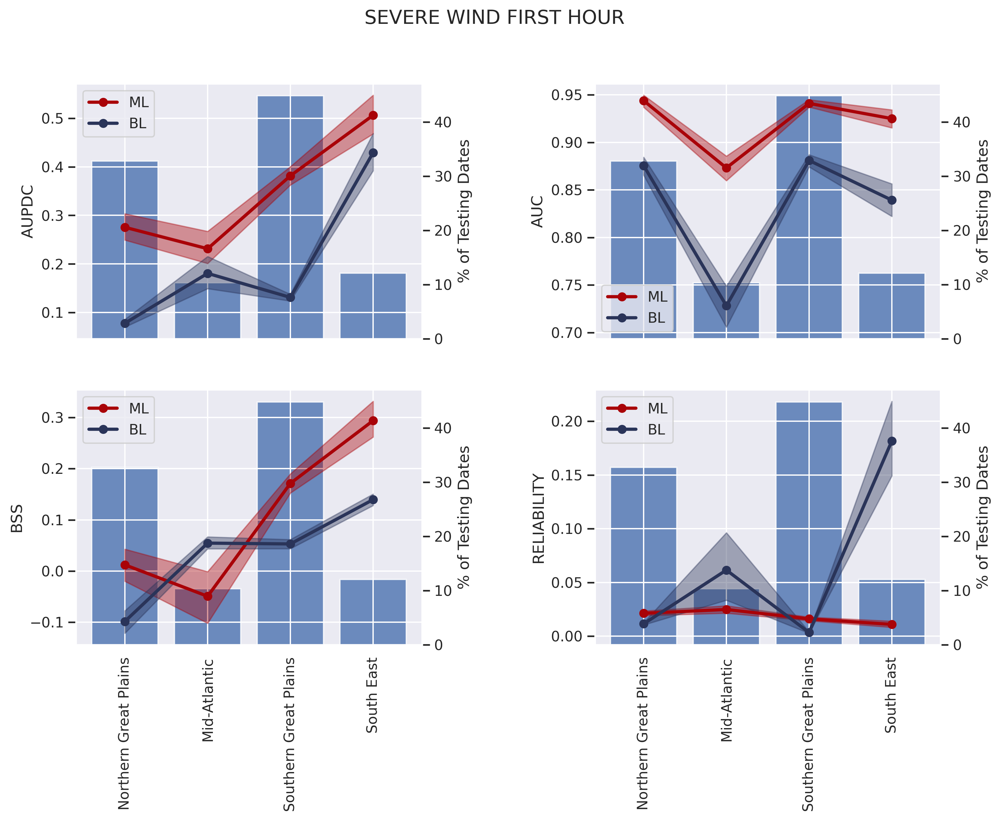

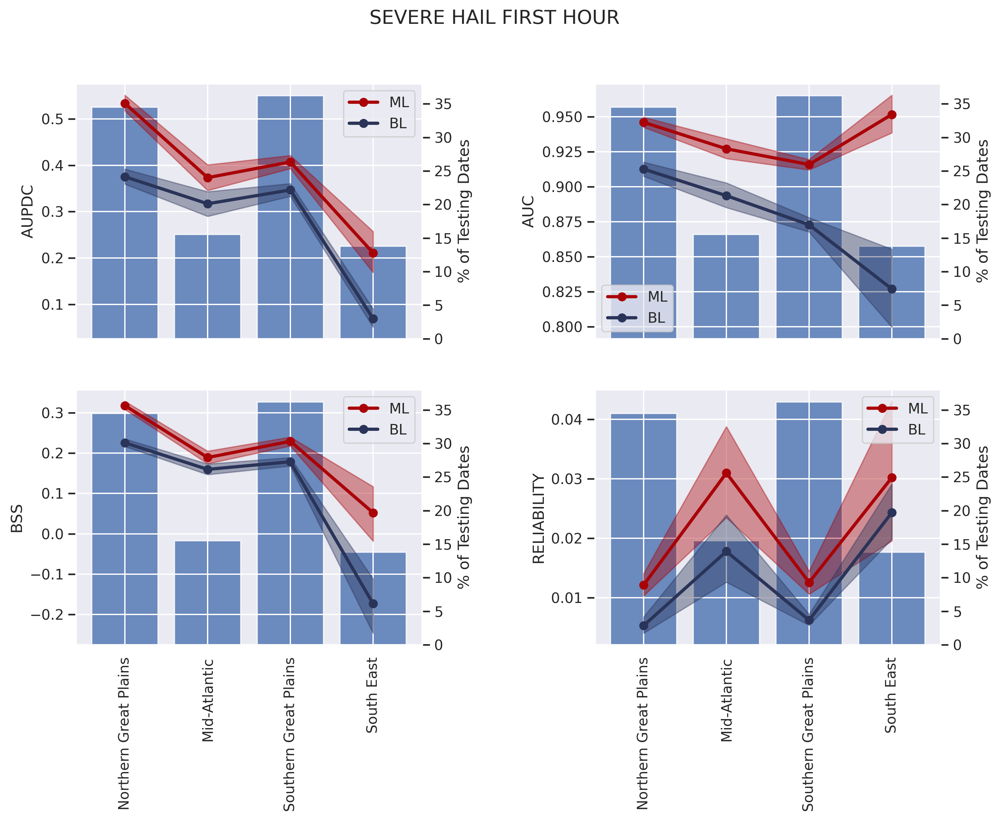

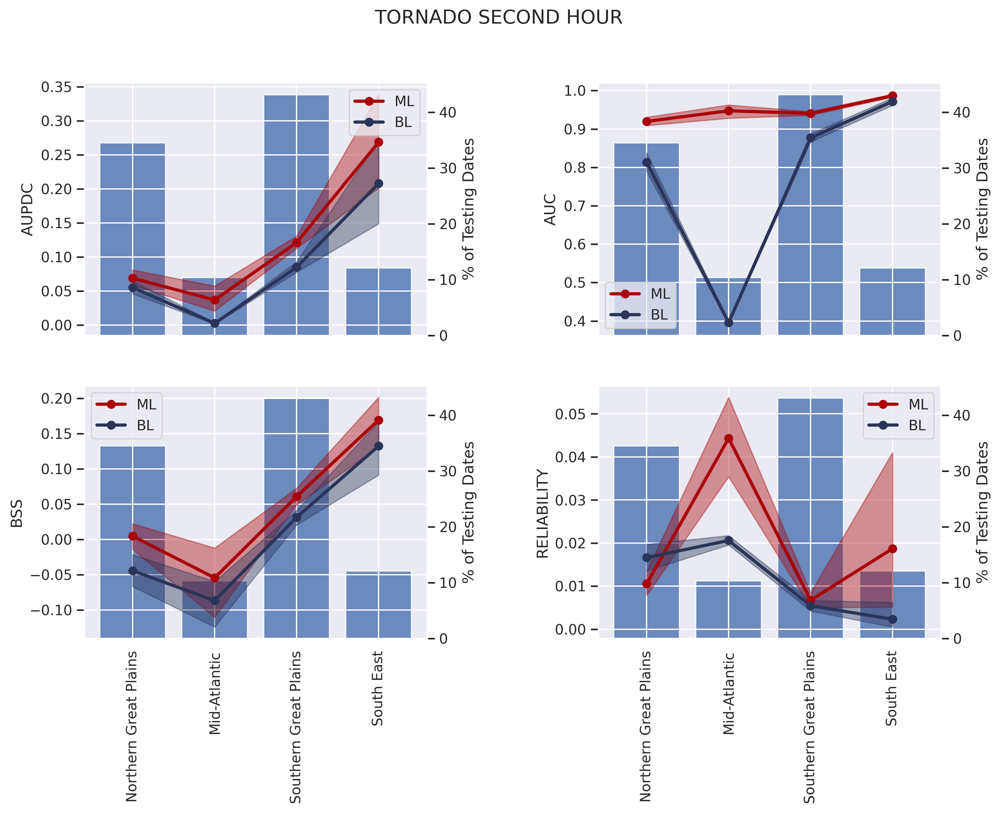

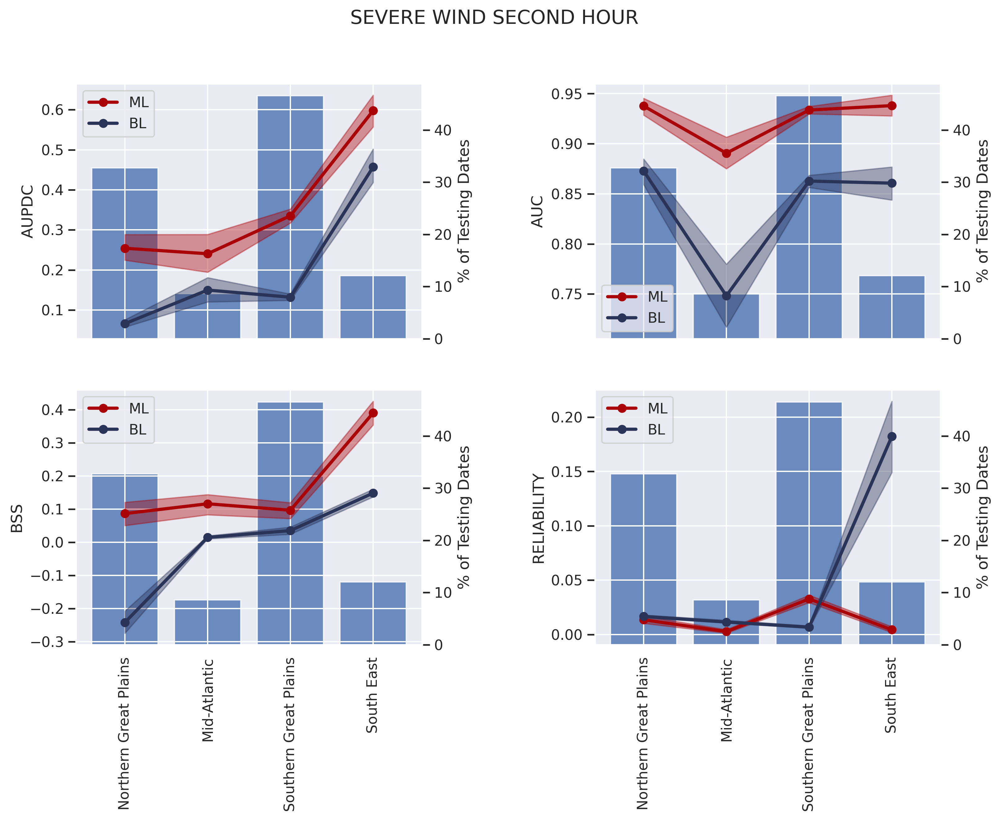

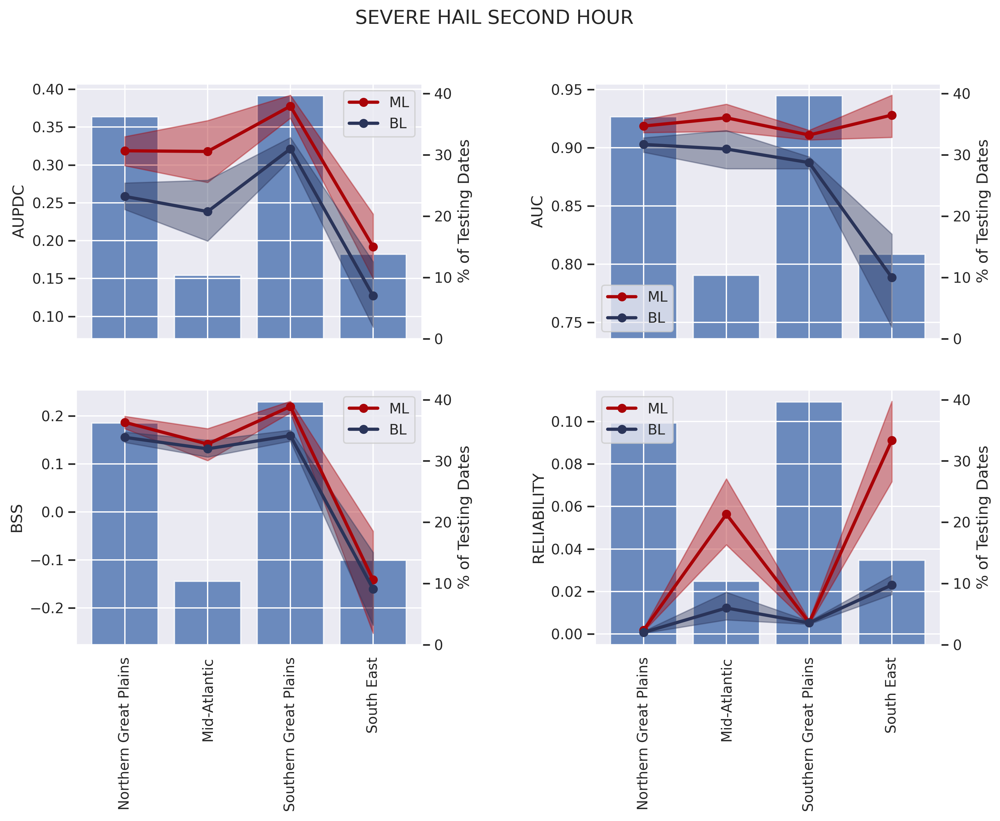

In [5]:
for lead_time, target in itertools.product(lead_times, targets):
    ml_ds = xr.load_dataset(join(path, f'ml_geographic_stratify_{lead_time}_{target}.nc'))
    bl_ds = xr.load_dataset(join(path, f'bl_geographic_stratify_{lead_time}_{target}.nc'))
    xdata = ml_ds['xdata'].values
    
    f,axes=plt.subplots(ncols=2, nrows=2, dpi=300, figsize=(12,8), sharex=True)
    metrics = ['aupdc', 'auc', 'bss', 'reliability']

    for ax, metric in zip(axes.flat, metrics):
        data = {'ML' : ml_ds[metric], 'BL' : bl_ds[metric]}
    
        pretty_plot(ax, xdata, data, 
                histdata=np.mean(ml_ds['Day Counts'].values, axis=1)*100., 
                xlabel='', 
                ylabel=metric.upper(), 
                right_ylabel = '% of Testing Dates',
                model_name='')
    
    plt.subplots_adjust(wspace=0.5, hspace=0.2)
    plt.suptitle(f"{target.replace('_', ' ').upper()} {lead_time.replace('_', ' ').upper()}", fontsize=15)